In [1]:
import pandas as pd
import numpy as np

In [2]:
data = pd.read_csv("game_data.csv")

In [16]:
data

,Unnamed: 0,TEAM_NAME,GP,W,L,W_PCT,MIN,FGM,FGA,FG_PCT,...,STL_RANK.1,BLK_RANK.1,BLKA_RANK.1,PF_RANK.1,PFD_RANK.1,PTS_RANK.1,PLUS_MINUS_RANK.1,Date.1,Score,Home-Team-Win
0,0,Charlotte Bobcats,1,1,0,1.000,48.0,37.0,76.0,0.487,...,23,10,24,30,15,26,24,11-2-2007-08,201,1
1,1,Orlando Magic,2,1,1,0.500,48.0,31.5,75.0,0.420,...,12,10,3,2,21,9,3,11-2-2007-08,208,0
2,2,Indiana Pacers,2,2,0,1.000,50.5,35.5,87.5,0.406,...,23,7,27,2,30,30,19,11-2-2007-08,172,1
3,3,New Jersey Nets,2,1,1,0.500,50.5,29.0,75.0,0.387,...,9,24,22,7,22,4,1,11-2-2007-08,175,0
4,4,Atlanta Hawks,1,1,0,1.000,48.0,36.0,79.0,0.456,...,25,3,3,10,18,24,11,11-2-2007-08,195,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15452,15452,Memphis Grizzlies,28,10,18,0.357,48.0,41.9,90.8,0.461,...,25,8,6,6,17,8,21,12-23-2019-20,260,0
15453,15453,Phoenix Suns,26,9,17,0.346,48.4,41.8,91.0,0.459,...,14,25,11,9,24,23,7,12-23-2019-20,224,0
15454,15454,Sacramento Kings,26,12,14,0.462,48.4,40.1,87.1,0.460,...,3,14,7,23,8,1,6,12-23-2019-20,217,0
15455,15455,Portland Trail Blazers,27,12,15,0.444,48.2,41.1,91.6,0.449,...,21,18,13,23,19,17,26,12-23-2019-20,196,0


In [17]:
y = data["Home-Team-Win"]

In [18]:
data["W_2"]

0         0
1         2
2         0
3         2
4         1
         ..
15452     9
15453    18
15454    19
15455     8
15456     7
Name: W_2, Length: 15457, dtype: int64

In [28]:
X = data[["W","L","FGM","FGA","FG_PCT","FG3M","FG3A",
    "FG3_PCT","FTM","FTA","FT_PCT","OREB","DREB","REB","AST","TOV","STL","BLK","BLKA","PF",
    "PTS","PLUS_MINUS",
    "W_2","L_2","FGM_2","FGA_2","FG_PCT_2","FG3M_2","FG3A_2",
    "FG3_PCT_2","FTM_2","FTA_2","FT_PCT_2","OREB_2","DREB_2","REB_2","AST_2","TOV_2","STL_2","BLK_2","BLKA_2","PF_2",
    "PTS_2","PLUS_MINUS_2","Score"]]
         

In [30]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [31]:
from sklearn.linear_model import LogisticRegression

In [33]:
clf = LogisticRegression(random_state=0, max_iter = 500).fit(X, y)

In [35]:
clf.score(X_test, y_test)

0.712997451480102

In [4]:
def gamePredicter(game_stats):
    
    data = pd.read_csv("game_data.csv")
    
    y = data["Home-Team-Win"]
    X = data[["W","L","FGM","FGA","FG_PCT","FG3M","FG3A",
    "FG3_PCT","FTM","FTA","FT_PCT","OREB","DREB","REB","AST","TOV","STL","BLK","BLKA","PF",
    "PTS","PLUS_MINUS",
    "W_2","L_2","FGM_2","FGA_2","FG_PCT_2","FG3M_2","FG3A_2",
    "FG3_PCT_2","FTM_2","FTA_2","FT_PCT_2","OREB_2","DREB_2","REB_2","AST_2","TOV_2","STL_2","BLK_2","BLKA_2","PF_2",
    "PTS_2","PLUS_MINUS_2","Score"]]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
    mod = LogisticRegression(random_state=0, max_iter = 500).fit(X, y)
    
    return mod.predict(game_stats)

In [5]:
def get_player_info(season, name):
    
    data = get_season_stats(season)
    
    data = data[['NAME','TEAM','AGE','GP','PPG','TS%','eFG%','USG%','APG','AST%','PER_n','PER', 'AST%', 'VI']]
    
    data['SEASON'] = season
    
    
    
    
    for index in range (len(data)):
        data_i = data.iloc[index]
        name_n = data_i['NAME']
        data_i['T_PTS'],data_i['PACE'],data_i['OEFF'] = get_team_player_stats(data_i['TEAM'], season)
        if name_n == name:
            return data_i

In [6]:
def get_team_player_stats(team, season):
    
    data = get_team_season_stats(season)
    data = data[['TEAM','PTS/GM','PACE','OEFF']]
    
    for index in range (len(data)):
        data_i = data.iloc[index]
        
        
        team_n = data_i['TEAM']
        #print(convert_team_name(team_n),index)
        if convert_team_name(team_n) == team:
            return data_i["PTS/GM"],data_i["PACE"],data_i["OEFF"]

In [7]:
def convert_team_name(team):
    
    teams_1 = ["Ind","Tor","Den","Atl","Uta","Nor","Cle","Nyk","Was","Phi","Mil","Lal","Gol","Bro","Min","Det","Bos","Cha","Lac","San","Dal","Chi","Hou","Pho","Mia","Orl","Sac","Mem","Okc","Por"]
    
    teams_2 = ["Indiana", "Toronto", "Denver", "Atlanta","Utah","New Orleans","Cleveland","New York", "Washington", "Philadelphia","Milwaukee","LA Lakers","Golden State","Brooklyn","Minnesota","Detroit","Boston","Charlotte","LA Clippers", "San Antonio","Dallas","Chicago","Houston","Phoenix","Miami","Orlando","Sacramento","Memphis","Oklahoma City","Portland"]
    
    for i in range(len(teams_1)):
        if teams_2[i] == team:
            return teams_1[i]
            

In [8]:
def get_index_info(season, index):
    
    data = get_season_stats(season)
    data = data[['NAME','TEAM','AGE','GP','TS%','eFG%','USG%','APG','AST%','PER_n','PER']]
    data = data.iloc[index]
    
    return data

In [9]:
def get_season_stats(season):
    
    filename = str(season) + "-" + str(season+1) + " NBA Player Stats.csv"
    
    data = pd.read_csv(filename)
    
    data = data.drop((len(data)-1),axis = 0) #last element is null
    

    return data

In [10]:
def get_team_season_stats(season):
    
    filename = str(season) + "-" + str(season+1) + " Team Stats.csv"
    
    data = pd.read_csv(filename)
    
    #data = data.drop((len(data)-1),axis = 0) #last element is null
    
    return data

In [12]:
get_team_season_stats(2020).head().to_latex()

'\\begin{tabular}{lrlllrrrrrrrrrrrrrrrrrrrl}\n\\toprule\n{} &  RANK &       TEAM &  CONF &   DIVISION &  GP &  PTS/GM &  aPTS/GM &  PTS DIFF &  PACE &   OEFF &   DEFF &  EDIFF &   SOS &  rSOS &   SAR &  CONS &    A4F &   W &   L &   WIN\\% &  eWIN\\% &  pWIN\\% &    ACH & STRK \\\\\n\\midrule\n0 &     1 &    Atlanta &  East &  Southeast &  72 &   113.7 &    111.4 &       2.3 &  97.6 &  115.7 &  113.3 &    2.4 & -0.52 &   0.0 &  1.88 &  14.7 &  0.032 &  41 &  31 &  0.569 &  0.565 &  0.576 &  0.004 &   W4 \\\\\n1 &     2 &     Boston &  East &   Atlantic &  72 &   112.6 &    111.2 &       1.4 &  98.2 &  114.0 &  112.5 &    1.5 & -0.33 &  -3.5 &  1.17 &  13.7 &  0.010 &  36 &  36 &  0.500 &  0.544 &  0.546 & -0.044 &   L1 \\\\\n2 &     3 &   Brooklyn &  East &   Atlantic &  72 &   118.6 &    114.1 &       4.5 &  99.5 &  118.3 &  113.8 &    4.5 & -0.44 &   0.0 &  4.06 &  13.2 &  0.074 &  48 &  24 &  0.667 &  0.633 &  0.648 &  0.034 &   W5 \\\\\n3 &     4 &  Charlotte &  East &  Southeast &

In [11]:
get_player_info(2020, 'Stephen Curry')

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/series.py:1056: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cacher_needs_updating = self._check_is_chained_assignment_possible()
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/indexing.py:1724: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer_missing(indexer, value)


NAME      Stephen Curry
TEAM                Gol
AGE               33.17
GP                 63.0
PPG                32.0
TS%                0.66
eFG%               0.61
USG%               34.8
APG                 5.8
AST%               30.5
PER_n             34.28
PER               25.71
AST%               30.5
VI                 11.8
SEASON             2020
T_PTS             113.7
PACE              102.2
OEFF              111.1
Name: 134, dtype: object

In [16]:
import seaborn as sns

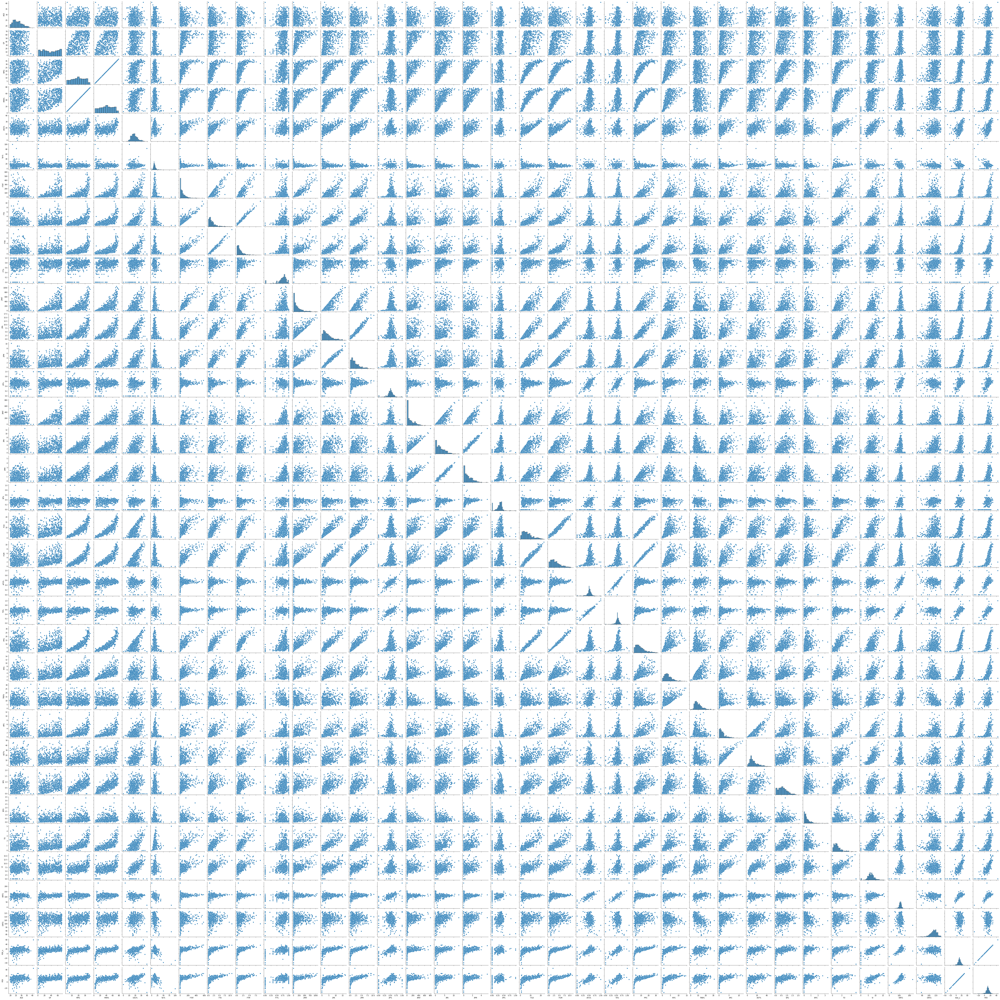

In [14]:
sns.pairplot(get_season_stats(2020))

In [15]:
get_season_stats(2020).head()

,NAME,TEAM,POS,AGE,GP,MPG,MIN%,USG%,Tor%,FTAT,...,APG,AST%,SPG,BPG,TO,VI,ORTG,DRTG,PER_n,PER
0,Precious Achiuwa,Mia,F,21.66,61.0,12.1,25.2,19.5,13.5,110.0,...,0.5,6.1,0.33,0.46,0.70,6.7,106.8,99.7,15.77,11.83
1,Jaylen Adams,Mil,G,25.03,7.0,2.6,5.4,18.5,0.0,0.0,...,0.3,12.6,0.00,0.00,0.00,5.1,NaN,NaN,-15.95,-11.96
2,Steven Adams,Nor,C,27.83,58.0,27.7,57.6,11.7,17.7,135.0,...,1.9,9.1,0.93,0.66,1.36,7.3,119.7,107.8,16.50,12.38
3,Bam Adebayo,Mia,C-F,23.83,64.0,33.5,69.7,23.7,15.0,354.0,...,5.4,26.9,1.17,1.03,2.64,11.6,121.7,105.0,27.00,20.25
4,LaMarcus Aldridge,San,C-F,35.83,21.0,25.9,54.0,22.7,7.0,37.0,...,1.7,10.2,0.38,0.86,0.95,7.3,107.3,110.0,18.60,13.95


In [11]:
data_1 = get_season_stats(2020)
data_2 = get_team_season_stats(2020)

df = pd.DataFrame()



df[['AGE','GP','PPG','TS%','eFG%','USG%','APG','AST%','PER_n','PER', 'VI']] = data_1[['AGE','GP','PPG','TS%','eFG%','USG%','APG','AST%','PER_n','PER', 'VI']]
df[['PTS/GM','PACE','OEFF']] = data_2[['PTS/GM','PACE','OEFF']]


In [20]:
df.head()

,AGE,GP,PPG,TS%,eFG%,USG%,APG,AST%,PER_n,PER,VI,PTS/GM,PACE,OEFF
0,21.66,61.0,5.0,0.55,0.54,19.5,0.5,6.1,15.77,11.83,6.7,113.7,97.6,115.7
1,25.03,7.0,0.3,0.13,0.13,18.5,0.3,12.6,-15.95,-11.96,5.1,112.6,98.2,114.0
2,27.83,58.0,7.6,0.60,0.61,11.7,1.9,9.1,16.50,12.38,7.3,118.6,99.5,118.3
3,23.83,64.0,18.7,0.63,0.57,23.7,5.4,26.9,27.00,20.25,11.6,109.5,98.2,110.9
4,35.83,21.0,13.7,0.55,0.52,22.7,1.7,10.2,18.60,13.95,7.3,110.7,99.0,111.2


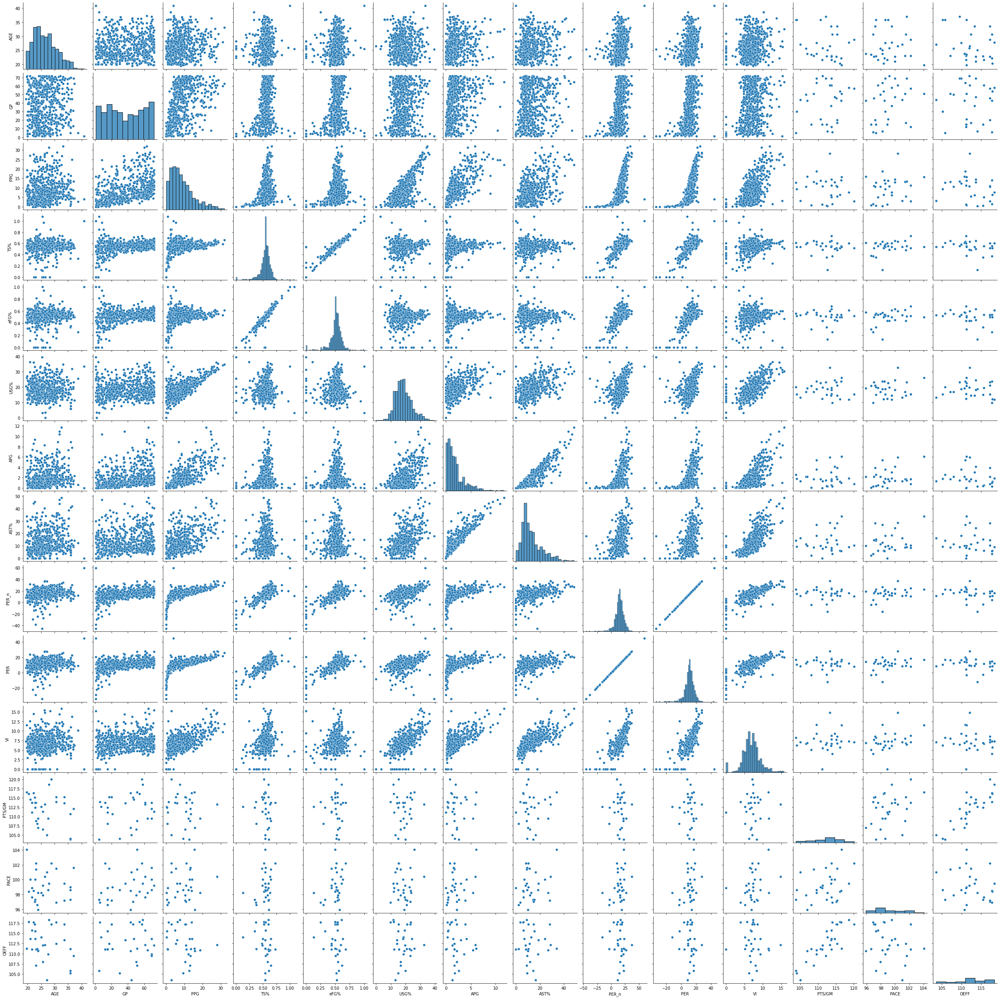

In [21]:
sns.pairplot(df)

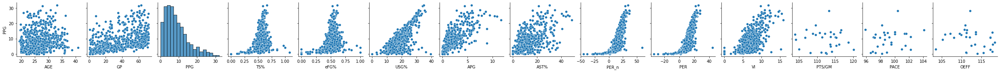

In [22]:
sns.pairplot(
    df,
    y_vars=["PPG"],
)

In [12]:
data_1 = get_season_stats(2019)
data_2 = get_team_season_stats(2019)

df_1 = pd.DataFrame()



df_1[['AGE','GP','PPG','TS%','eFG%','USG%','APG','AST%','PER_n','PER', 'VI']] = data_1[['AGE','GP','PPG','TS%','eFG%','USG%','APG','AST%','PER_n','PER', 'VI']]
df_1[['PTS/GM','PACE','OEFF']] = data_2[['PTS/GM','PACE','OEFF']]

In [13]:
def get_player_PPG(season, name):
    
    data = get_season_stats(season)
    data = data[['NAME','PPG']]
    
    for index in range (len(data)):
        data_i = data.iloc[index]
        name_n = data_i['NAME']
        if name_n == name:
            return data_i

In [14]:
def get_Y(names, season):
        
    Y = []
    
    for name in names:
        
        Y.append(get_player_PPG(season, name))
    
    return Y

In [26]:
#2019 rosters to save time

names = ['Steven Adams',
 'Bam Adebayo',
 'LaMarcus Aldridge',
 'Kyle Alexander',
 'Nickeil Alexander-Walker',
 'Grayson Allen',
 'Jarrett Allen',
 'Kadeem Allen',
 'Al-Farouq Aminu',
 'Justin Anderson',
 'Kyle Anderson',
 'Ryan Anderson',
 'Giannis Antetokounmpo',
 'Kostas Antetokounmpo',
 'Thanasis Antetokounmpo',
 'Carmelo Anthony',
 'OG Anunoby',
 'Ryan Arcidiacono',
 'Trevor Ariza',
 'Trevor Ariza',
 'D.J. Augustin',
 'Deandre Ayton',
 'Dwayne Bacon',
 'Marvin Bagley III',
 'Lonzo Ball',
 'Mo Bamba',
 'J.J. Barea',
 'Harrison Barnes',
 'RJ Barrett',
 'Will Barton',
 'Keita Bates-Diop',
 'Keita Bates-Diop',
 'Nicolas Batum',
 'Aron Baynes',
 'Kent Bazemore',
 'Kent Bazemore',
 'Darius Bazley',
 'Bradley Beal',
 'Malik Beasley',
 'Malik Beasley',
 'Marco Belinelli',
 'Jordan Bell',
 'Jordan Bell',
 "DeAndre' Bembry",
 'Dragan Bender',
 'Dragan Bender',
 'Davis Bertans',
 'Patrick Beverley',
 'Khem Birch',
 'Goga Bitadze',
 'Bismack Biyombo',
 'Nemanja Bjelica',
 'Eric Bledsoe',
 'Bojan Bogdanovic',
 'Bogdan Bogdanovic',
 'Bol Bol',
 'Jonah Bolden',
 'Jonah Bolden',
 'Marques Bolden',
 'Jordan Bone',
 'Isaac Bonga',
 'Devin Booker',
 'Chris Boucher',
 'Brian Bowen II',
 'Ky Bowman',
 'Avery Bradley',
 'Tony Bradley',
 'Jarrell Brantley', 
 'Ignas Brazdeikis',
 'Corey Brewer',
 'Miles Bridges',
 'Mikal Bridges',
 'Oshae Brissett',
 'Ryan Broekhoff',
 'Malcolm Brogdon',
 'Dillon Brooks',
 'Charles Brown Jr.',
 'Troy Brown Jr.',
 'Bruce Brown',
 'Jaylen Brown',
 'Moses Brown',
 'Sterling Brown',
 'Jalen Brunson',
 'Thomas Bryant',
 'Reggie Bullock',
 'Trey Burke',
 'Trey Burke',
 'Alec Burks',
 'Alec Burks',
 'Deonte Burton',
 'Jimmy Butler',
 'Bruno Caboclo',
 'Bruno Caboclo',
 'Devontae Cacok',
 'Kentavious Caldwell-Pope',
 'Vlatko Cancar',
 'Clint Capela',
 'DeMarre Carroll',
 'DeMarre Carroll',
 'Wendell Carter Jr.',
 'Jevon Carter',
 'Vince Carter',
 'Michael Carter-Williams',
 'Alex Caruso',
 'Willie Cauley-Stein',
 'Willie Cauley-Stein',
 'Tyson Chandler',
 'Wilson Chandler',
 'Joe Chealey',
 'Zylan Cheatham',
 'Chris Chiozza',
 'Chris Chiozza',
 'Marquese Chriss',
 'Brandon Clarke',
 'Gary Clark',
 'Gary Clark',
 'Jordan Clarkson',
 'Jordan Clarkson',
 'Nicolas Claxton',
 'Chris Clemons',
 'Antonius Cleveland',
 'Amir Coffey',
 'John Collins',
 'Zach Collins',
 'Mike Conley',
 'Pat Connaughton',
 'Quinn Cook',
 'Tyler Cook',
 'Tyler Cook',
 'Robert Covington',
 'Robert Covington',
 'Allen Crabbe',
 'Allen Crabbe',
 'Torrey Craig',
 'Jamal Crawford',
 'Jae Crowder',
 'Jae Crowder',
 'Jarrett Culver',
 'Seth Curry',
 'Stephen Curry',
 'Troy Daniels',
 'Troy Daniels',
 'Anthony Davis',
 'Ed Davis',
 'Terence Davis',
 'Dewayne Dedmon',
 'Dewayne Dedmon',
 'Matthew Dellavedova',
 'DeMar DeRozan',
 'Cheick Diallo',
 'Hamidou Diallo',
 'Gorgui Dieng',
 'Gorgui Dieng',
 'Spencer Dinwiddie',
 'Donte DiVincenzo',
 'Luka Doncic',
 'Luguentz Dort',
 'Damyean Dotson',
 'Sekou Doumbouya',
 'PJ Dozier',
 'Goran Dragic',
 'Andre Drummond',
 'Andre Drummond',
 'Jared Dudley',
 'Kris Dunn',
 'Carsen Edwards',
 'Henry Ellenson',
 'Wayne Ellington',
 'Joel Embiid',
 'James Ennis III',
 'James Ennis III',
 'Drew Eubanks',
 'Jacob Evans',
 'Jacob Evans',
 'Dante Exum',
 'Dante Exum',
 'Tacko Fall',
 'Derrick Favors',
 'Cristiano Felicio',
 'Terrance Ferguson',
 'Bruno Fernando',
 'Yogi Ferrell',
 'Dorian Finney-Smith',
 'Bryn Forbes',
 'Evan Fournier',
 "De'Aaron Fox",
 'Melvin Frazier Jr.',
 'Michael Frazier',
 'Tim Frazier',
 'Markelle Fultz',
 'Wenyen Gabriel',
 'Wenyen Gabriel',
 'Daniel Gafford',
 'Danilo Gallinari',
 'Langston Galloway',
 'Darius Garland',
 'Marc Gasol',
 'Rudy Gay',
 'Paul George',
 'Taj Gibson',
 'Harry Giles III',
 'Shai Gilgeous-Alexander',
 'Rudy Gobert',
 'Brandon Goodwin',
 'Aaron Gordon',
 'Eric Gordon',
 "Devonte' Graham",
 'Treveon Graham',
 'Treveon Graham',
 'Jerami Grant',
 'Jerian Grant',
 'Josh Gray',
 'Danny Green',
 'Draymond Green',
 'JaMychal Green',
 'Javonte Green',
 'Jeff Green',
 'Jeff Green',
 'Blake Griffin',
 'Marko Guduric',
 'Kyle Guy',
 'Rui Hachimura',
 'Devon Hall',
 'Donta Hall',
 'Donta Hall',
 'Dusty Hannahs',
 'Tim Hardaway Jr.',
 'James Harden',
 'Maurice Harkless',
 'Maurice Harkless',
 'Jared Harper',
 'Montrezl Harrell',
 'Gary Harris',
 'Joe Harris',
 'Shaquille Harrison',
 'Tobias Harris',
 'Isaiah Hartenstein',
 'Josh Hart',
 'Udonis Haslem',
 'Jaxson Hayes',
 'Gordon Hayward',
 'John Henson',
 'John Henson',
 'Dewan Hernandez',
 'Juancho Hernangomez',
 'Juancho Hernangomez',
 'Willy Hernangomez',
 'Tyler Herro',
 'Kevin Hervey',
 'Mario Hezonja',
 'Buddy Hield',
 'George Hill',
 'Solomon Hill',
 'Solomon Hill',
 'Jaylen Hoard',
 'Aaron Holiday',
 'Jrue Holiday',
 'Justin Holiday',
 'Rondae Hollis-Jefferson',
 'Richaun Holmes',
 'Rodney Hood',
 'Al Horford',
 'Talen Horton-Tucker',
 'Danuel House Jr.',
 'Dwight Howard',
 'William Howard',
 'Kevin Huerter',
 "De'Andre Hunter",
 'Chandler Hutchison',
 'Serge Ibaka',
 'Andre Iguodala',
 'Ersan Ilyasova',
 'Joe Ingles',
 'Brandon Ingram',
 'Kyrie Irving',
 'Jonathan Isaac',
 'Wes Iwundu',
 'Jaren Jackson Jr.',
 'Frank Jackson',
 'Josh Jackson',
 'Justin Jackson',
 'Reggie Jackson',
 'Reggie Jackson',
 'Justin James',
 'LeBron James',
 'Amile Jefferson',
 'DaQuan Jeffries',
 'Ty Jerome',
 'Alize Johnson',
 'BJ Johnson',
 'Cameron Johnson',
 'James Johnson',
 'James Johnson',
 'Keldon Johnson',
 'Stanley Johnson',
 'Tyler Johnson',
 'Tyler Johnson',
 'Nikola Jokic',
 'Derrick Jones Jr.',
 'Damian Jones',
 'Tyus Jones',
 'DeAndre Jordan',
 'Cory Joseph',
 'Mfiondu Kabengele',
 'Frank Kaminsky',
 'Enes Kanter',
 'Luke Kennard',
 'Michael Kidd-Gilchrist',
 'Michael Kidd-Gilchrist',
 'Stanton Kidd',
 'Louis King',
 'Maxi Kleber',
 'Brandon Knight',
 'Brandon Knight',
 'Kevin Knox II',
 'John Konchar',
 'Furkan Korkmaz',
 'Luke Kornet',
 'Kyle Korver',
 'Rodions Kurucs',
 'Kyle Kuzma',
 'Skal Labissiere',
 'Jeremy Lamb',
 'Romeo Langford',
 'Zach LaVine',
 'Vic Law',
 'Jake Layman',
 'TJ Leaf',
 'Jalen Lecque',
 'Courtney Lee',
 'Damion Lee',
 'Alex Len',
 'Alex Len',
 'Kawhi Leonard',
 'Meyers Leonard',
 'Caris LeVert',
 'Damian Lillard',
 'Nassir Little',
 'Kevon Looney',
 'Brook Lopez',
 'Robin Lopez',
 'Kevin Love',
 'Kyle Lowry',
 'Timothe Luwawu-Cabarrot',
 'Trey Lyles',
 'Daryl Macon',
 'J.P. Macura',
 'Josh Magette',
 'Ian Mahinmi',
 'Thon Maker',
 'Terance Mann',
 'Boban Marjanovic',
 'Lauri Markkanen',
 'Caleb Martin',
 'Cody Martin',
 'Jeremiah Martin',
 'Kelan Martin',
 'Frank Mason',
 'Garrison Mathews',
 'Wesley Matthews',
 'Luc Mbah a Moute',
 'Patrick McCaw',
 'CJ McCollum',
 'T.J. McConnell',
 'Jalen McDaniels',
 'Doug McDermott',
 'JaVale McGee',
 'Rodney McGruder',
 'Alfonzo McKinnie',
 'Jordan McLaughlin',
 'Ben McLemore',
 'Jordan McRae',
 'Jordan McRae',
 'Jordan McRae',
 'Nicolo Melli',
 "De'Anthony Melton",
 'Chimezie Metu',
 'Khris Middleton',
 'Eric Mika',
 'CJ Miles',
 'Malcolm Miller',
 'Paul Millsap',
 'Patty Mills',
 'Shake Milton',
 'Donovan Mitchell',
 'Naz Mitrou-Long',
 'Adam Mokoka',
 'Malik Monk',
 'Matt Mooney',
 "E'Twaun Moore",
 'Ja Morant',
 'Juwan Morgan',
 'Marcus Morris Sr.',
 'Marcus Morris Sr.',
 'Markieff Morris',
 'Markieff Morris',
 'Monte Morris',
 'Johnathan Motley',
 'Emmanuel Mudiay',
 'Mychal Mulder',
 'Dejounte Murray',
 'Jamal Murray',
 'Dzanan Musa',
 'Mike Muscala',
 'Svi Mykhailiuk',
 'Abdel Nader',
 'Larry Nance Jr.',
 'Shabazz Napier',
 'Shabazz Napier',
 'Raul Neto',
 'Malik Newman',
 'Georges Niang',
 'Joakim Noah',
 'Nerlens Noel',
 'Zach Norvell Jr.',
 'Zach Norvell Jr.',
 'Jaylen Nowell',
 'Frank Ntilikina',
 'Kendrick Nunn',
 'Jusuf Nurkic',
 'David Nwaba',
 'Semi Ojeleye',
 'Jahlil Okafor',
 'Elie Okobo',
 'Josh Okogie',
 'KZ Okpala',
 'Victor Oladipo',
 'Kelly Olynyk',
 "Royce O'Neale",
 'Miye Oni',
 "Kyle O'Quinn",
 'Cedi Osman',
 'Kelly Oubre Jr.',
 'Tariq Owens',
 'Jeremy Pargo',
 'Jabari Parker',
 'Jabari Parker',
 'Chandler Parsons',
 'Eric Paschall',
 'Anzejs Pasecniks',
 'Patrick Patterson',
 'Justin Patton',
 'Chris Paul',
 'Cameron Payne',
 'Gary Payton II',
 'Elfrid Payton',
 'Norvel Pelle',
 'Theo Pinson',
 'Mason Plumlee',
 'Jakob Poeltl',
 'Vincent Poirier',
 'Shamorie Ponds',
 'Jordan Poole',
 'Kevin Porter Jr.',
 'Michael Porter Jr.',
 'Otto Porter Jr.',
 'Bobby Portis',
 'Kristaps Porzingis',
 'Dwight Powell',
 'Norman Powell',
 'Taurean Prince',
 'Chasson Randle',
 'Julius Randle',
 'Josh Reaves',
 'Cam Reddish',
 'JJ Redick',
 'Naz Reid',
 'Josh Richardson',
 'Austin Rivers',
 'Andre Roberson',
 'Glenn Robinson III',
 'Glenn Robinson III',
 'Duncan Robinson',
 'Jerome Robinson',
 'Jerome Robinson',
 'Justin Robinson',
 'Mitchell Robinson',
 'Isaiah Roby',
 'Rajon Rondo',
 'Derrick Rose',
 'Terrence Ross',
 'Terry Rozier',
 'Ricky Rubio',
 "D'Angelo Russell",
 "D'Angelo Russell",
 'Domantas Sabonis',
 'Luka Samanic',
 'JaKarr Sampson',
 'Dario Saric',
 'Tomas Satoransky',
 'Admiral Schofield',
 'Dennis Schroder',
 'Mike Scott',
 'Thabo Sefolosha',
 'Collin Sexton',
 'Landry Shamet',
 'Marial Shayok',
 'Iman Shumpert',
 'Pascal Siakam',
 'Chris Silva',
 'Ben Simmons',
 'Anfernee Simons',
 'Alen Smailagic',
 'Marcus Smart',
 'Dennis Smith Jr.',
 'Ish Smith',
 'JR Smith',
 'Zhaire Smith',
 'Tony Snell',
 'Omari Spellman',
 'Max Strus',
 'Edmond Sumner',
 'Caleb Swanigan',
 'Caleb Swanigan',
 'Jayson Tatum',
 'Jeff Teague',
 'Jeff Teague',
 'Garrett Temple',
 'Daniel Theis',
 'Isaiah Thomas',
 'Khyri Thomas',
 'Lance Thomas',
 'Matt Thomas',
 'Tristan Thompson',
 'Sindarius Thornwell',
 'Matisse Thybulle',
 'Anthony Tolliver',
 'Anthony Tolliver',
 'Anthony Tolliver',
 'Juan Toscano-Anderson',
 'Karl-Anthony Towns',
 'Gary Trent Jr.',
 'Allonzo Trier',
 'P.J. Tucker',
 'Rayjon Tucker',
 'Evan Turner',
 'Myles Turner',
 'Jarrod Uthoff',
 'Jarrod Uthoff',
 'Jonas Valanciunas',
 'Denzel Valentine',
 'Jarred Vanderbilt',
 'Jarred Vanderbilt',
 'Fred VanVleet',
 'Gabe Vincent',
 'Noah Vonleh',
 'Noah Vonleh',
 'Nikola Vucevic',
 'Dean Wade',
 'Moritz Wagner',
 'Dion Waiters',
 'Dion Waiters',
 'Lonnie Walker IV',
 'Kemba Walker',
 'Tyrone Wallace',
 'Derrick Walton Jr.',
 'Derrick Walton Jr.',
 'Brad Wanamaker',
 'T.J. Warren',
 'P.J. Washington',
 'Yuta Watanabe',
 'Tremont Waters',
 'Paul Watson',
 'Paul Watson',
 'Quinndary Weatherspoon',
 'Russell Westbrook',
 'Coby White',
 'Derrick White',
 'Hassan Whiteside',
 'Andrew Wiggins',
 'Andrew Wiggins',
 'Robert Williams III',
 'Nigel Williams-Goss',
 'Grant Williams',
 'Johnathan Williams',
 'Kenrich Williams',
 'Lou Williams',
 'Marvin Williams',
 'Marvin Williams',
 'Zion Williamson',
 'D.J. Wilson',
 'Justise Winslow',
 'Christian Wood',
 'Delon Wright',
 'Justin Wright-Foreman',
 'Thaddeus Young',
 'Trae Young',
 'Cody Zeller',
 'Tyler Zeller',
 'Ante Zizic',
 'Ivica Zubac']

In [27]:
y = get_Y(names, 2020)

In [19]:
df_1['nPPG']=get_season_stats(2020)['PPG']

In [33]:
df_1.head()

,AGE,GP,PPG,TS%,eFG%,USG%,APG,AST%,PER_n,PER,VI,PTS/GM,PACE,OEFF,nPPG
0,27.07,63.0,10.9,0.60,0.59,17.3,2.3,13.2,21.90,15.97,9.2,113.3,103.9,108.2,5.0
1,23.08,72.0,15.9,0.60,0.56,21.2,5.1,24.2,24.02,17.51,11.2,112.4,99.6,112.3,0.3
2,35.07,53.0,18.9,0.57,0.53,23.4,2.4,11.4,23.08,16.82,8.4,112.2,100.8,109.6,7.6
3,23.81,2.0,1.0,0.50,0.50,9.9,0.0,0.0,-0.57,-0.42,0.0,110.7,98.6,111.4,18.7
4,21.95,47.0,5.7,0.47,0.46,23.3,1.9,21.1,11.59,8.45,8.5,104.9,99.0,104.8,13.7


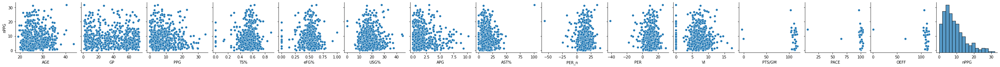

In [20]:
sns_plot=sns.pairplot(
    df_1,
    y_vars=["nPPG"],
)
sns_plot.savefig("pairplot.png")


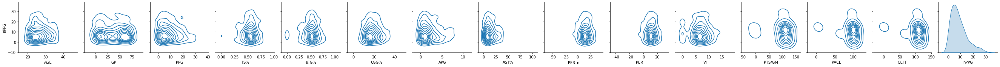

In [37]:
sns.pairplot(
    df_1,
    y_vars=["nPPG"],
    kind = 'kde'
)